In our next step, we wish to analyze the weather and temperature data of the respective countries since the outbreak of the virus. We have composed a dataset here: https://www.kaggle.com/winterpierre91/covid19-global-weather-data

We hope to find some colleration between certain weather metrics and the speed of the number of infections/deaths.

Save to HTML
https://community.plotly.com/t/proper-way-to-save-a-plot-to-html/7063

In [2]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "ggplot2"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

/Users/ariadnacuffi/opt/anaconda3/lib/python3.7/site-packages/lightgbm/__init__.py:48: UserWarning:

Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.



Load the cleaned data from https://www.kaggle.com/imdevskp/corona-virus-report.

In [3]:
cleaned_data = pd.read_csv('covid_19_clean_complete.csv', parse_dates=['Date'])

cleaned_data.rename(columns={'ObservationDate': 'date', 
                     'Province/State':'state',
                     'Country/Region':'country',
                     'Last Update':'last_updated',
                     'Confirmed': 'confirmed',
                     'Deaths':'deaths',
                     'Recovered':'recovered'
                    }, inplace=True)

# cases 
cases = ['confirmed', 'deaths', 'recovered', 'active']

# Active Case = confirmed - deaths - recovered
cleaned_data['active'] = cleaned_data['confirmed'] - cleaned_data['deaths'] - cleaned_data['recovered']

# replacing Mainland china with just China
cleaned_data['country'] = cleaned_data['country'].replace('Mainland China', 'China')

# filling missing values 
cleaned_data[['state']] = cleaned_data[['state']].fillna('')
cleaned_data[cases] = cleaned_data[cases].fillna(0)
cleaned_data.rename(columns={'Date':'date'}, inplace=True)

data = cleaned_data

display(data.head())
display(data.info())

,state,country,Lat,Long,date,confirmed,deaths,recovered,active
0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0
1,,Albania,41.1533,20.1683,2020-01-22,0,0,0,0
2,,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0
3,,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0
4,,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21222 entries, 0 to 21221
Data columns (total 9 columns):
state        21222 non-null object
country      21222 non-null object
Lat          21222 non-null float64
Long         21222 non-null float64
date         21222 non-null datetime64[ns]
confirmed    21222 non-null int64
deaths       21222 non-null int64
recovered    21222 non-null int64
active       21222 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(4), object(2)
memory usage: 1.5+ MB


None

In [4]:
# Check if the data is updated
print("External Data")
print(f"Earliest Entry: {data['date'].min()}")
print(f"Last Entry:     {data['date'].max()}")

External Data
Earliest Entry: 2020-01-22 00:00:00
Last Entry:     2020-04-11 00:00:00


In [5]:
data.head()

,state,country,Lat,Long,date,confirmed,deaths,recovered,active
0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0
1,,Albania,41.1533,20.1683,2020-01-22,0,0,0,0
2,,Algeria,28.0339,1.6596,2020-01-22,0,0,0,0
3,,Andorra,42.5063,1.5218,2020-01-22,0,0,0,0
4,,Angola,-11.2027,17.8739,2020-01-22,0,0,0,0


## 2. Population

We wish to have a closer look at the infection and fatality ratio, when normalized by country population size. This will surely give us an interesting perspective as to which countries are doing better and which ones are not.

https://www.kaggle.com/tanuprabhu/population-by-country-2020

In [6]:
def p2f(x):
    """
    Convert urban percentage to float
    """
    try:
        return float(x.strip('%'))/100
    except:
        return np.nan

def age2int(x):
    """
    Convert Age to integer
    """
    try:
        return int(x)
    except:
        return np.nan

def fert2float(x):
    """
    Convert Fertility Rate to float
    """
    try:
        return float(x)
    except:
        return np.nan


countries_df = pd.read_csv("population_by_country_2020.csv", converters={'Urban Pop %':p2f,
                                                                                                             'Fert. Rate':fert2float,
                                                                                                             'Med. Age':age2int})
countries_df.rename(columns={'Country (or dependency)': 'country',
                             'Population (2020)' : 'population',
                             'Density (P/Km²)' : 'density',
                             'Fert. Rate' : 'fertility',
                             'Med. Age' : "age",
                             'Urban Pop %' : 'urban_percentage'}, inplace=True)



countries_df['country'] = countries_df['country'].replace('United States', 'US')
countries_df = countries_df[["country", "population", "density", "fertility", "age", "urban_percentage"]]

countries_df.head()

,country,population,density,fertility,age,urban_percentage
0,China,1439323776,153,1.7,38.0,0.61
1,India,1380004385,464,2.2,28.0,0.35
2,US,331002651,36,1.8,38.0,0.83
3,Indonesia,273523615,151,2.3,30.0,0.56
4,Pakistan,220892340,287,3.6,23.0,0.35


In [7]:
data = pd.merge(data, countries_df, on='country')
data.head()

,state,country,Lat,Long,date,confirmed,deaths,recovered,active,population,density,fertility,age,urban_percentage
0,,Afghanistan,33.0,65.0,2020-01-22,0,0,0,0,38928346,60,4.6,18.0,0.25
1,,Afghanistan,33.0,65.0,2020-01-23,0,0,0,0,38928346,60,4.6,18.0,0.25
2,,Afghanistan,33.0,65.0,2020-01-24,0,0,0,0,38928346,60,4.6,18.0,0.25
3,,Afghanistan,33.0,65.0,2020-01-25,0,0,0,0,38928346,60,4.6,18.0,0.25
4,,Afghanistan,33.0,65.0,2020-01-26,0,0,0,0,38928346,60,4.6,18.0,0.25


## 3. Adding the temperature Data

The dataset from: https://www.kaggle.com/winterpierre91/covid19-global-weather-data by @winterpierre91

In [8]:
df_temperature = pd.read_csv("temperature_dataframe.csv")
df_temperature['country'] = df_temperature['country'].replace('USA', 'US')
df_temperature['country'] = df_temperature['country'].replace('UK', 'United Kingdom')
df_temperature = df_temperature[["country", "province", "date", "humidity", "sunHour", "tempC", "windspeedKmph"]].reset_index()
df_temperature.rename(columns={'province': 'state'}, inplace=True)
df_temperature["date"] = pd.to_datetime(df_temperature['date'])
df_temperature['state'] = df_temperature['state'].fillna('')
df_temperature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16677 entries, 0 to 16676
Data columns (total 8 columns):
index            16677 non-null int64
country          16677 non-null object
state            16677 non-null object
date             16677 non-null datetime64[ns]
humidity         16500 non-null float64
sunHour          16500 non-null float64
tempC            16500 non-null float64
windspeedKmph    16500 non-null float64
dtypes: datetime64[ns](1), float64(4), int64(1), object(2)
memory usage: 1.0+ MB


In [9]:
data = data.merge(df_temperature, on=['country','date', 'state'], how='inner')
data['mortality_rate'] = data['deaths'] / data['confirmed']

In [10]:
data.head()

,state,country,Lat,Long,date,confirmed,deaths,recovered,active,population,density,fertility,age,urban_percentage,index,humidity,sunHour,tempC,windspeedKmph,mortality_rate
0,,Afghanistan,33.0,65.0,2020-01-22,0,0,0,0,38928346,60,4.6,18.0,0.25,0,65.0,8.7,-1.0,8.0,NaN
1,,Afghanistan,33.0,65.0,2020-01-23,0,0,0,0,38928346,60,4.6,18.0,0.25,1,59.0,8.7,-3.0,8.0,NaN
2,,Afghanistan,33.0,65.0,2020-01-24,0,0,0,0,38928346,60,4.6,18.0,0.25,2,71.0,7.1,0.0,7.0,NaN
3,,Afghanistan,33.0,65.0,2020-01-25,0,0,0,0,38928346,60,4.6,18.0,0.25,3,79.0,8.7,0.0,7.0,NaN
4,,Afghanistan,33.0,65.0,2020-01-26,0,0,0,0,38928346,60,4.6,18.0,0.25,4,64.0,8.7,-1.0,8.0,NaN


In [11]:
data.describe()

,Lat,Long,confirmed,deaths,recovered,active,population,density,fertility,age,urban_percentage,index,humidity,sunHour,tempC,windspeedKmph,mortality_rate
count,11638.000000,11638.000000,11638.000000,11638.000000,11638.000000,11638.000000,1.163800e+04,11638.000000,11458.000000,11458.000000,11398.000000,11638.000000,11520.000000,11520.000000,11520.000000,11520.000000,5293.000000
mean,22.877814,30.081798,380.531449,13.829868,151.797646,214.903935,2.782792e+08,334.411583,2.238776,34.298831,0.653100,6633.882454,63.516146,8.646493,16.397049,12.361285,0.013979
std,24.821627,70.595019,3988.533078,178.721725,2162.934077,2277.174401,5.360348e+08,1978.759922,1.020779,7.975900,0.187607,4196.988880,20.604686,2.599630,11.509561,7.581626,0.065837
min,-41.454500,-123.120700,0.000000,0.000000,0.000000,0.000000,3.812800e+04,2.000000,1.200000,17.000000,0.150000,0.000000,5.000000,1.500000,-21.000000,1.000000,0.000000
25%,8.619500,-8.224500,0.000000,0.000000,0.000000,0.000000,5.106626e+06,31.000000,1.700000,29.000000,0.560000,3089.250000,49.000000,6.900000,8.000000,7.000000,0.000000
50%,27.610400,27.953400,0.000000,0.000000,0.000000,0.000000,2.549988e+07,108.000000,1.800000,38.000000,0.630000,6230.500000,69.000000,8.700000,15.000000,10.000000,0.000000
75%,42.315400,101.058300,18.000000,0.000000,1.000000,9.000000,8.378394e+07,153.000000,2.400000,41.000000,0.810000,9791.750000,79.000000,11.600000,27.000000,16.000000,0.007916
max,64.963100,174.886000,67800.000000,4825.000000,58946.000000,50633.000000,1.439324e+09,26337.000000,6.100000,48.000000,0.980000,16676.000000,99.000000,14.000000,45.000000,65.000000,1.000000


## Temperature by country

In [12]:
temp_gdf = data.groupby(['date', 'country'])['tempC', 'humidity'].mean()
temp_gdf = temp_gdf.reset_index()
temp_gdf['date'] = pd.to_datetime(temp_gdf['date'])
temp_gdf['date'] = temp_gdf['date'].dt.strftime('%m/%d/%Y')

temp_gdf['tempC_pos'] = temp_gdf['tempC'] - temp_gdf['tempC'].min()  # To use it with size

wind_gdf = data.groupby(['date', 'country'])['windspeedKmph'].max()
wind_gdf = wind_gdf.reset_index()
wind_gdf['date'] = pd.to_datetime(temp_gdf['date'])
wind_gdf['date'] = wind_gdf['date'].dt.strftime('%m/%d/%Y')

In [13]:
target_gdf = data.groupby(['date', 'country'])['confirmed', 'deaths'].sum()
target_gdf = target_gdf.reset_index()
target_gdf['date'] = pd.to_datetime(target_gdf['date'])
target_gdf['date'] = target_gdf['date'].dt.strftime('%m/%d/%Y')

The first figure is temperature by country. It's obvious that north side is cold and south side is hot.

In [14]:
fig1 = px.scatter_geo(temp_gdf.fillna(0), locations="country", locationmode='country names', 
                     color="tempC", size='tempC_pos', hover_name="country", 
                     range_color= [-20, 45], 
                     projection="natural earth", animation_frame="date", 
                     title='Temperature by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig1.show()

The second figure is humidity by country. It seems there's no clear location-humidity relation like temperature. We can see humidity is relatively low in China, while humidity is always high in Europe region.

In [15]:
fig = px.scatter_geo(temp_gdf.fillna(0), locations="country", locationmode='country names', 
                     color="humidity", size='humidity', hover_name="country", 
                     range_color= [0, 100], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Humidity by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

In [16]:
gdf = pd.merge(target_gdf, temp_gdf, on=['date', 'country'])
gdf['confirmed_log1p'] = np.log1p(gdf['confirmed'])
gdf['deaths_log1p'] = np.log1p(gdf['deaths'])
gdf['mortality_rate'] = gdf['deaths'] / gdf['confirmed']

gdf = pd.merge(gdf, wind_gdf, on=['date', 'country'])

## Visualization for corona spread - weather relationship

### Temperature

Now let's see the relationship with Corona spread with temperature.

The figure circle size shows number of corona confirmed cases, and color shows temperature.

We can see Corona started in China when the temperature is cold, but its spread does not easily stop even when temperature increases in China.
Also Corona spread in Europe started with relatively high, medium temperature (around 20C).

In [17]:
fig3 = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="tempC", size='confirmed', hover_name="country", 
                     range_color= [-20, 45], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed VS Temperature by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig3.show()

In [18]:
py.offline.plot(fig3, filename='myplot.html')

'myplot.html'

In [19]:
fig3.write_html("filename.html")

I will change the visualization: circle size is now shown with log scale, to show how corona spreads not only major country.

Now we can see that Corona's confirmed cases appears indeed worldwide. Even temperature is high, corona can happen (but its confirmed cases may become fewer).

In [20]:
fig_save = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="tempC", size='confirmed_log1p', hover_name="country", 
                     range_color= [-20, 45], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: log1p(confirmed) VS Temperature by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig_save.show()

In [21]:
py.offline.plot(fig_save, filename='myplot_p.html')

'myplot_p.html'

Above we saw confirmed cases, how about number of deaths?

We see that number of death is high in China, Europe, US and Iran. Even though these are north-side, cooler temperature region, I feel this is simply because population is high.

In [22]:
fig = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="tempC", size='deaths', hover_name="country", 
                     range_color= [-20, 45], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: deaths VS temperature by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

We can check mortality rate, instead of total number of deaths, to see if the weather affect on Coronavirus worsening.

We see that mortality rate is not so related to region or temperature.
Mortality rate is high at the beginning stage of spread in each country (maybe because total inspection number is low), but many country seem to be converging to around 3% mortality rate.

In [22]:
fig = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="tempC", size='mortality_rate', hover_name="country", 
                     range_color= [-20, 45], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Mortality rate VS Temperature by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

### Humidity

Now let's move to humidity.

We can see corona spreads in China where humidity is low, as well as Europe where humidity is high. Humidity may not help to slow down Coronavirus.

In [23]:
fig_h = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="humidity", size='confirmed_log1p', hover_name="country", 
                     range_color= [0, 100], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: log1p(confirmed) VS Humidity by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig_h.show()

In [24]:
py.offline.plot(fig_h, filename='myplot_p.html')

'myplot_p.html'

I couldn't find relationship between humidity & mortality rate too.

In [25]:
fig = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="humidity", size='mortality_rate', hover_name="country", 
                     range_color= [0, 100], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Mortality rate VS humidity by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

### WindSpeed

At last, let's see relationship between wind speed and Corona spread.

It seems wind speed is relative high in Europe, is it related to the reason that the Corona is widely spread in the Europe region in short term??

In [26]:
fig = px.scatter_geo(gdf.fillna(0), locations="country", locationmode='country names', 
                     color="windspeedKmph", size='confirmed_log1p', hover_name="country", 
                     range_color= [0, 40], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: log1p(Confirmed) VS Wind speed by country', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

That's all!

I felt from this data analysis that Coronavirus spread all over the world, the wheather change seems not help to slow down its spread easily.
We might need to find other factor which affects Coronavirus spread.

Text(0.5, 1.0, 'Temperature and Confirmed')

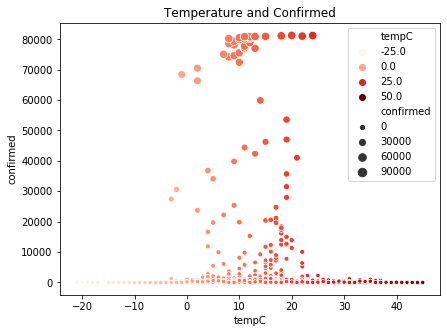

In [23]:
# Confirmed by temperature:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.scatterplot('tempC', 'confirmed',hue="tempC", data=gdf, palette='Reds', size='confirmed')
plt.title('Temperature and Confirmed')

Text(0.5, 1.0, 'Humidity and Confirmed')

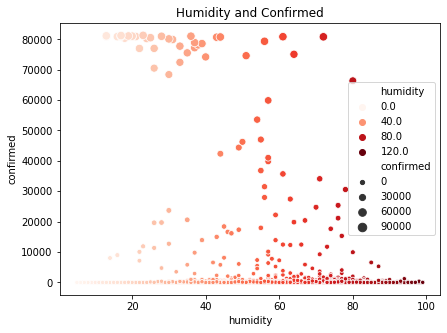

In [25]:
# Confirmed by temperature:
plt.figure(figsize=(15,5))
plt.subplot(121)
sns.scatterplot('humidity', 'confirmed',hue="humidity", data=gdf, palette='Reds', size='confirmed')
plt.title('Humidity and Confirmed')